## Data 620 Project 1

**By Eddie Xu and Mohamed Hassan-El Serafi**

For your first project, you are asked to:

Identify and load a network dataset that has some categorical information available for each node.
For each of the nodes in the dataset, calculate degree centrality and eigenvector centrality.
Compare your centrality measures across your categorical groups.
For example, using the dataset from a study of romantic relationships among high school students in Columbus, Ohio [http://researchnews.osu.edu/archive/chains.htm], you might want to determine if there are any differences in your calculated centrality measures between the two sexes.  You might use a t-test or another statistical measure to support your findings.

You may work in a small group.  Your project should be delivered in an Jupyter Notebook, and posted in GitHub.  Your project is due end of day Monday. You and your team should created a video presentation about your project. You should be ready to present your project in our Meet-up on Thursday.

## Data Source and Analysis Description

There is a listing of different network data analyses from the University of Colorado, which you can find here: https://icon.colorado.edu/networks. A network analysis highlighted on the website was the Global Air Transportation Network. The analysis used a set of datasets comprising of airlines, airplanes, airports and routes, which are available on Kaggle and can be found here: https://www.kaggle.com/datasets/thedevastator/global-air-transportation-network-mapping-the-wo/data. The purpose of this analysis is to identify which airports have the most connections (degree centrality), as well as which airports are most connected to other airports that are highly connected (eigenvector centrality). 

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import random
import movecolumn as mc
from scipy import stats
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline

## Airports Dataset

In [2]:
airports_df = pd.read_csv("airports.csv")

In [3]:
airports_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7698 entries, 0 to 7697
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   index                  7698 non-null   int64  
 1   Airport ID             7698 non-null   int64  
 2   Name                   7698 non-null   object 
 3   City                   7649 non-null   object 
 4   Country                7698 non-null   object 
 5   IATA                   7698 non-null   object 
 6   ICAO                   7698 non-null   object 
 7   Latitude               7698 non-null   float64
 8   Longitude              7698 non-null   float64
 9   Altitude               7698 non-null   int64  
 10  Timezone               7698 non-null   object 
 11  DST                    7698 non-null   object 
 12  Tz database time zone  7698 non-null   object 
 13  Type                   7698 non-null   object 
 14  Source                 7698 non-null   object 
dtypes: f

In [4]:
airports_df.head()

,index,Airport ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
0,0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [5]:
airports_profile = ProfileReport(airports_df, title="Airports Profiling Report")

In [6]:
airports_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Routes Dataset

In [7]:
routes_df = pd.read_csv("routes.csv.zip")

In [8]:
routes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67663 entries, 0 to 67662
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   67663 non-null  int64 
 1   Airline                 67663 non-null  object
 2   Airline ID              67663 non-null  object
 3   Source airport          67663 non-null  object
 4   Source airport ID       67663 non-null  object
 5   Destination airport     67663 non-null  object
 6   Destination airport ID  67663 non-null  object
 7   Codeshare               14597 non-null  object
 8   Stops                   67663 non-null  int64 
 9   Equipment               67645 non-null  object
dtypes: int64(2), object(8)
memory usage: 5.2+ MB


In [9]:
routes_df.head()

,index,Airline,Airline ID,Source airport,Source airport ID,Destination airport,Destination airport ID,Codeshare,Stops,Equipment
0,0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [10]:
routes_profile = ProfileReport(routes_df, title="Routes Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

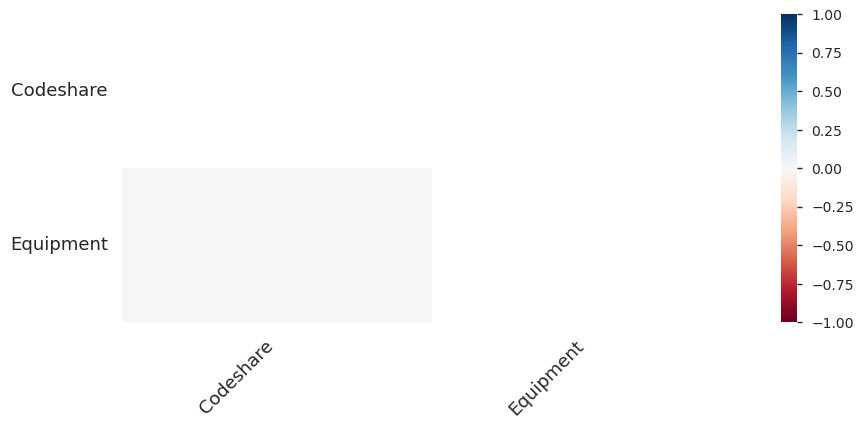

In [11]:
routes_profile

## Selecting Columns

In [12]:
routes_columns = routes_df.iloc[:, [3, 5, 8]]
routes_columns.head()

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,ASF,MRV,0
3,CEK,KZN,0
4,CEK,OVB,0


In [13]:
airports_columns = airports_df.iloc[:, [2, 3, 4, 5, 7, 8]]
airports_columns.head()

,Name,City,Country,IATA,Latitude,Longitude
0,Goroka Airport,Goroka,Papua New Guinea,GKA,-6.081690,145.391998
1,Madang Airport,Madang,Papua New Guinea,MAG,-5.207080,145.789001
2,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,-5.826790,144.296005
3,Nadzab Airport,Nadzab,Papua New Guinea,LAE,-6.569803,146.725977
4,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,-9.443380,147.220001


## Creating Nodes

We focused on the Northern and Southern Hemispheres, respectively. To split the dataset, we used the Latitude column, with the Northern Hemisphere being represented by Latitude values greater than zero and the Southern Hemisphere represented by values less than zero.

### Northern Hemisphere

In [14]:
airports_columns = airports_columns[airports_columns.Latitude > 0]
airports_columns.head()

,Name,City,Country,IATA,Latitude,Longitude
6,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,61.160500,-45.425999
7,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,64.190903,-51.678101
8,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,67.012222,-50.711603
9,Thule Air Base,Thule,Greenland,THU,76.531197,-68.703201
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701


Additionally, we identified which airports are in the Eastern or Western Hemisphere by 

In [15]:
airports_columns['Hemisphere'] = np.where(airports_columns['Longitude'] < 0, 'W', 'E')
airports_columns.iloc[4:8]

,Name,City,Country,IATA,Latitude,Longitude,Hemisphere
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701,W
11,Egilsstaðir Airport,Egilsstadir,Iceland,EGS,65.283302,-14.401400,W
12,Hornafjörður Airport,Hofn,Iceland,HFN,64.295601,-15.227200,W
13,Húsavík Airport,Husavik,Iceland,HZK,65.952301,-17.426001,W


In [16]:
len(airports_columns)

6082

In [17]:
airports_columns

,Name,City,Country,IATA,Latitude,Longitude,Hemisphere
6,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,61.160500,-45.425999,W
7,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,64.190903,-51.678101,W
8,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,67.012222,-50.711603,W
9,Thule Air Base,Thule,Greenland,THU,76.531197,-68.703201,W
10,Akureyri Airport,Akureyri,Iceland,AEY,65.660004,-18.072701,W
...,...,...,...,...,...,...,...
7692,Kubinka Air Base,Kubinka,Russia,\N,55.611695,36.650002,E
7693,Rogachyovo Air Base,Belaya,Russia,\N,71.616699,52.478298,E
7694,Ulan-Ude East Airport,Ulan Ude,Russia,\N,51.849998,107.737999,E
7695,Krechevitsy Air Base,Novgorod,Russia,\N,58.625000,31.385000,E


## Creating Edges

In [18]:
set(routes_columns['Source airport']) == set(routes_columns['Destination airport'])

False

In [19]:
len(routes_columns['Source airport'].unique())

3409

In [20]:
len(routes_columns['Destination airport'].unique())

3418

In [21]:
airport_nodes = set(routes_columns['Source airport']) | set(routes_columns['Destination airport'])
len(airport_nodes)

3425

In [22]:
airport_nodes = pd.DataFrame(airport_nodes, columns = ['IATA'])
airport_nodes_merge = pd.merge(airport_nodes, airports_columns, on='IATA', how='inner')
airport_nodes_merge.head()

,IATA,Name,City,Country,Latitude,Longitude,Hemisphere
0,CGM,Camiguin Airport,Camiguin,Philippines,9.253520,124.707001,E
1,TAC,Daniel Z. Romualdez Airport,Tacloban,Philippines,11.228035,125.027761,E
2,ATK,Atqasuk Edward Burnell Sr Memorial Airport,Atqasuk,United States,70.467300,-157.436005,W
3,EWR,Newark Liberty International Airport,Newark,United States,40.692501,-74.168701,W
4,TAB,Tobago-Crown Point Airport,Scarborough,Trinidad and Tobago,11.149700,-60.832199,W


In [23]:
len(airport_nodes_merge)

2581

In [24]:
len(routes_columns)

67663

In [25]:
routes_columns

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,ASF,MRV,0
3,CEK,KZN,0
4,CEK,OVB,0
...,...,...,...
67658,WYA,ADL,0
67659,DME,FRU,0
67660,FRU,DME,0
67661,FRU,OSS,0


In [26]:
routes_merge = pd.merge(routes_columns,airport_nodes_merge[['IATA']],left_on='Source airport',right_on='IATA',how='inner')
routes_merge2 = pd.merge(routes_merge,airport_nodes_merge[['IATA']],left_on='Destination airport',right_on='IATA',how='inner')
routes = routes_merge2.loc[:, 'Source airport':'Stops']
routes.head()

,Source airport,Destination airport,Stops
0,AER,KZN,0
1,ASF,KZN,0
2,CEK,KZN,0
3,DME,KZN,0
4,DME,KZN,0


In [27]:
len(routes)

59830

In [28]:
random.seed(42)
G = nx.from_pandas_edgelist(routes, 'Source airport', 'Destination airport', True, nx.DiGraph())
nx.set_node_attributes(G, airport_nodes.set_index('IATA').to_dict('index'))

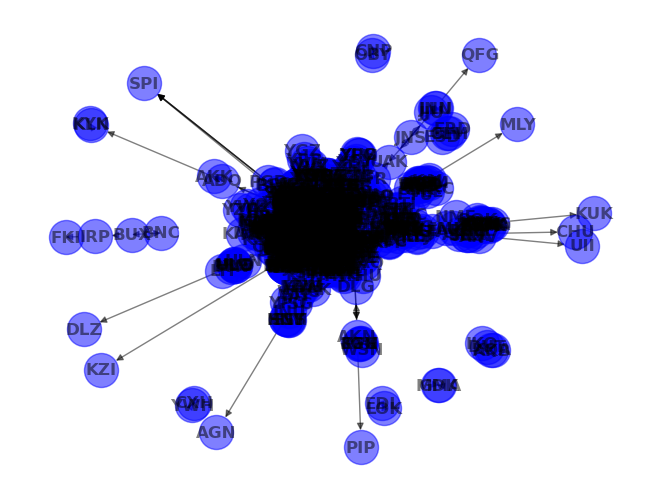

In [29]:
nx.draw(G, with_labels=True, node_color="blue", node_size=600, font_weight='bold', 
        edge_color="black", alpha=0.5)

## Degree of Connections

In [30]:
# get the min and max for the degree
degree_airports = nx.degree(G)
degree_airports_min = min(dict(degree_airports).values())
degree_airports_max = max(dict(degree_airports).values())
print(f'For the degree of connections, the min is {degree_airports_min} and the max is {degree_airports_max}')

For the degree of connections, the min is 1 and the max is 453


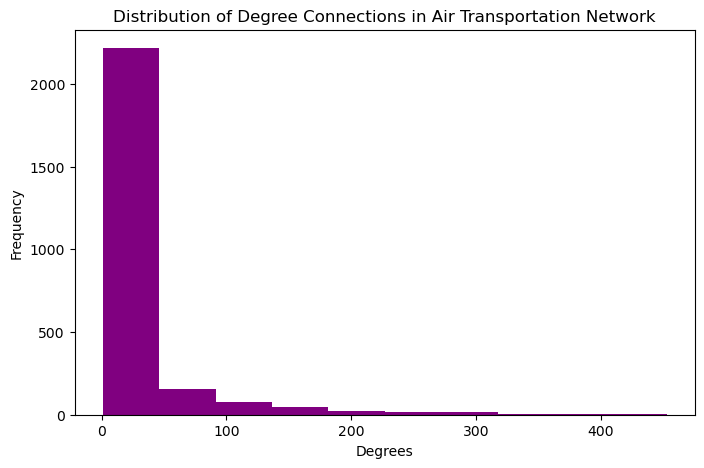

In [31]:
# get the top 5
airports_sorted = sorted(dict(degree_airports).items(), key=lambda item: item[1], reverse=True)
top_5_airports_degree = airports_sorted[:5]

# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_sorted).values(), color = "purple")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Connections in Air Transportation Network');

In [32]:
airport_conn_df = pd.DataFrame(degree_airports, columns = ['IATA', 'Degree_Connections'])
airport_conn_df = pd.merge(airport_conn_df, airports_columns, on='IATA', how='inner')
sorted_airport_conn_df = airport_conn_df.sort_values('Degree_Connections', ascending = False)
top_5_sorted_airport_conn_df = sorted_airport_conn_df.head()
top_5_sorted_airport_conn_df

,IATA,Degree_Connections,Name,City,Country,Latitude,Longitude,Hemisphere
30,FRA,453,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
17,IST,441,Istanbul Airport,Istanbul,Turkey,41.275278,28.751944,E
68,AMS,440,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
71,CDG,440,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
467,ATL,417,Hartsfield Jackson Atlanta International Airport,Atlanta,United States,33.636700,-84.428101,W


In [33]:
sorted_airport_conn_df.tail()

,IATA,Degree_Connections,Name,City,Country,Latitude,Longitude,Hemisphere
2084,ELV,1,Elfin Cove Seaplane Base,Elfin Cove,United States,58.195202,-136.347000,W
2416,JQE,1,Jaqué Airport,Jaqué,Panama,7.517780,-78.157204,W
2407,KUK,1,Kasigluk Airport,Kasigluk,United States,60.874401,-162.524002,W
2531,FKI,1,Bangoka International Airport,Kisangani,Congo (Kinshasa),0.481639,25.337999,E
2296,MSW,1,Massawa International Airport,Massawa,Eritrea,15.670000,39.370098,E


In [34]:
airport_conn_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Degree_Connections                                             \
                          count       mean        std  min  25%  50%   75%   
0          E             1378.0  28.933237  55.336666  1.0  4.0  8.0  24.0   
1          W             1191.0  21.759866  49.101433  1.0  2.0  6.0  16.0   

          
     max  
0  453.0  
1  417.0

In [35]:
degW = airport_conn_df[airport_conn_df.Hemisphere=='W']
degE = airport_conn_df[airport_conn_df.Hemisphere=='E']

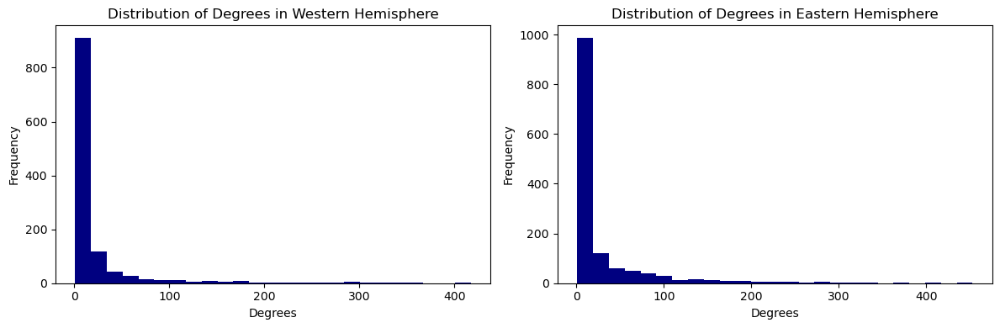

In [36]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(degW['Degree_Connections'], 25, color = "navy")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(degE['Degree_Connections'], 25, color = "navy")
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Eastern Hemisphere')

plt.tight_layout()
plt.show()

## Degree Centrality

In [37]:
# get the min and max of degree centrality
airports_dc = nx.degree_centrality(G) 
airports_dc_min = min(dict(airports_dc).values())
airports_dc_max = max(dict(airports_dc).values())
print(f'For the degree centrality, the min is {airports_dc_min} and the max is {airports_dc_max}')

For the degree centrality, the min is 0.0003894080996884735 and the max is 0.1764018691588785


In [38]:
# get the top 5
airports_dc_sorted = sorted(airports_dc.items(), key=lambda item: item[1], reverse=True)
top_5_airports_dc = airports_dc_sorted[:5]
top_5_airports_dc

[('FRA', 0.1764018691588785),
 ('IST', 0.17172897196261683),
 ('AMS', 0.17133956386292834),
 ('CDG', 0.17133956386292834),
 ('ATL', 0.16238317757009346)]

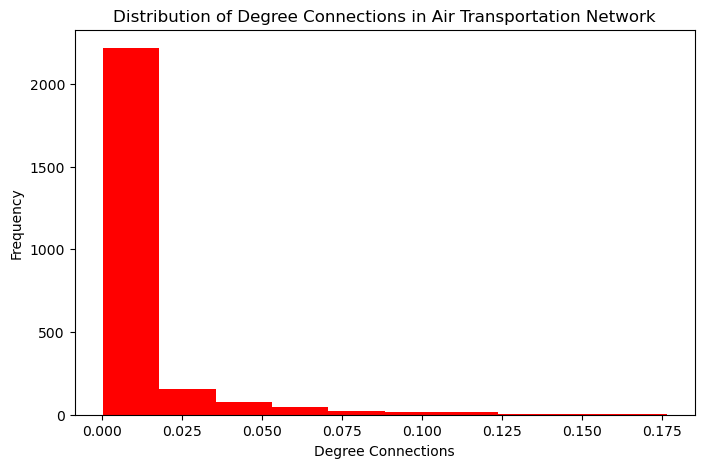

In [39]:
# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_dc_sorted).values(), color = "red")
plt.xlabel('Degree Connections')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Connections in Air Transportation Network');

In [40]:
airports_dc_df = pd.DataFrame.from_dict(airports_dc, orient='index').reset_index()
airports_dc_df.columns = ['IATA', 'Degree_Centrality']
airports_dc_df = pd.merge(airports_dc_df, airports_columns, on='IATA', how='inner')
sorted_airports_dc_df = airports_dc_df.sort_values('Degree_Centrality', ascending = False)
top_5_sorted_airports_dc_df = sorted_airports_dc_df.head()
top_5_sorted_airports_dc_df

,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
30,FRA,0.176402,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
17,IST,0.171729,Istanbul Airport,Istanbul,Turkey,41.275278,28.751944,E
68,AMS,0.171340,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
71,CDG,0.171340,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
467,ATL,0.162383,Hartsfield Jackson Atlanta International Airport,Atlanta,United States,33.636700,-84.428101,W


In [41]:
sorted_airports_dc_df.tail()

,IATA,Degree_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
2084,ELV,0.000389,Elfin Cove Seaplane Base,Elfin Cove,United States,58.195202,-136.347000,W
2416,JQE,0.000389,Jaqué Airport,Jaqué,Panama,7.517780,-78.157204,W
2407,KUK,0.000389,Kasigluk Airport,Kasigluk,United States,60.874401,-162.524002,W
2531,FKI,0.000389,Bangoka International Airport,Kisangani,Congo (Kinshasa),0.481639,25.337999,E
2296,MSW,0.000389,Massawa International Airport,Massawa,Eritrea,15.670000,39.370098,E


In [42]:
airports_dc_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Degree_Centrality                                          \
                         count      mean       std       min       25%   
0          E            1378.0  0.011267  0.021549  0.000389  0.001558   
1          W            1191.0  0.008473  0.019120  0.000389  0.000779   

                                 
        50%       75%       max  
0  0.003115  0.009346  0.176402  
1  0.002336  0.006231  0.162383

In [43]:
dcW = airports_dc_df[airports_dc_df.Hemisphere=='W']
dcE = airports_dc_df[airports_dc_df.Hemisphere=='E']

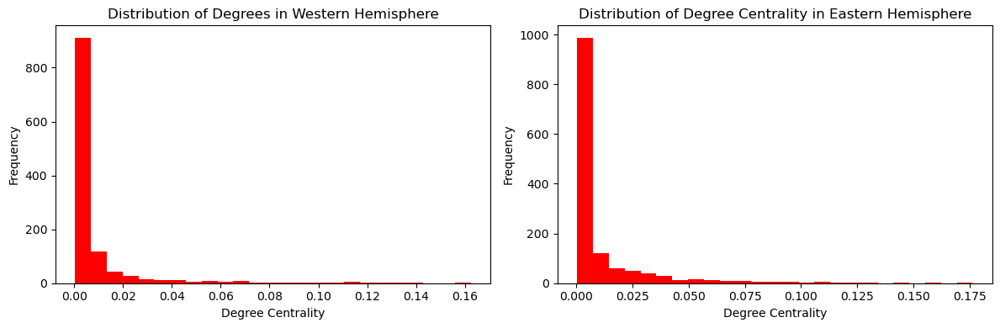

In [44]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(dcW['Degree_Centrality'], 25, color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degrees in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(dcE['Degree_Centrality'], 25, color = "red")
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Degree Centrality in Eastern Hemisphere')

plt.tight_layout()
plt.show()

## Eigenvector Centrality

In [45]:
# get the min and max for closeness centrality
airports_eig = nx.eigenvector_centrality(G)
airports_eig_min = min(dict(airports_eig).values())
airports_eig_max = max(dict(airports_eig).values())
print(f'For the eigenvector centrality, the min is {airports_eig_min} and the max is {airports_eig_max}')

For the eigenvector centrality, the min is 1.3934174087034381e-42 and the max is 0.16501182847253829


In [46]:
# get the top 10
airports_eig_sorted = sorted(airports_eig.items(), key=lambda item: item[1], reverse=True)
top_5_airports_eig = airports_eig_sorted[:5]
top_5_airports_eig

[('AMS', 0.16501182847253829),
 ('FRA', 0.16478551566587712),
 ('CDG', 0.15699618023853634),
 ('MUC', 0.150296774761785),
 ('FCO', 0.13611032463278172)]

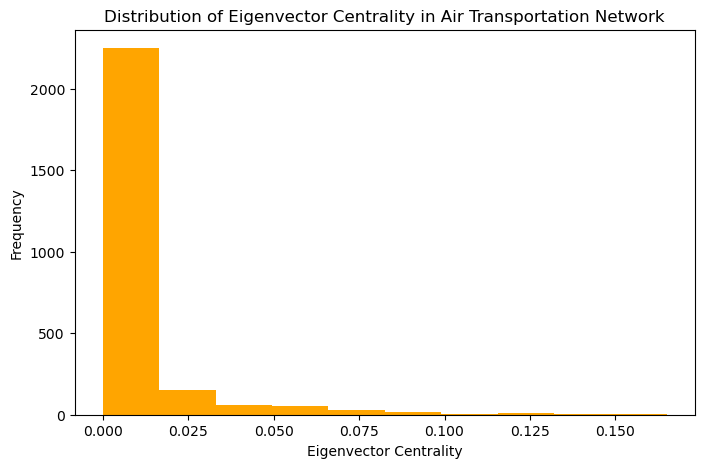

In [47]:
# plot
plt.figure(figsize=(8,5))
plt.hist(dict(airports_eig_sorted).values(), color = "orange")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Air Transportation Network');

In [48]:
airports_eig_df = pd.DataFrame.from_dict(airports_eig, orient='index').reset_index()
airports_eig_df.columns = ['IATA', 'Eigenvector_Centrality']
airports_eig_df = pd.merge(airports_eig_df, airports_columns, on='IATA', how='inner')
sorted_airports_eig_df = airports_eig_df.sort_values('Eigenvector_Centrality', ascending = False)
top_5_sorted_airports_eig_df = sorted_airports_eig_df.head()
top_5_sorted_airports_eig_df

,IATA,Eigenvector_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
68,AMS,0.165012,Amsterdam Airport Schiphol,Amsterdam,Netherlands,52.308601,4.763890,E
30,FRA,0.164786,Frankfurt am Main Airport,Frankfurt,Germany,50.033333,8.570556,E
71,CDG,0.156996,Charles de Gaulle International Airport,Paris,France,49.012798,2.550000,E
44,MUC,0.150297,Munich Airport,Munich,Germany,48.353802,11.786100,E
49,FCO,0.136110,Leonardo da Vinci–Fiumicino Airport,Rome,Italy,41.800278,12.238889,E


In [49]:
sorted_airports_eig_df.tail()

,IATA,Eigenvector_Centrality,Name,City,Country,Latitude,Longitude,Hemisphere
2296,MSW,1.393417e-42,Massawa International Airport,Massawa,Eritrea,15.670000,39.370098,E
2416,JQE,1.393417e-42,Jaqué Airport,Jaqué,Panama,7.517780,-78.157204,W
2413,PTU,1.393417e-42,Platinum Airport,Port Moller,United States,59.011398,-161.820007,W
1209,TTA,1.393417e-42,Tan Tan Airport,Tan Tan,Morocco,28.448200,-11.161300,W
2084,ELV,1.393417e-42,Elfin Cove Seaplane Base,Elfin Cove,United States,58.195202,-136.347000,W


In [50]:
airports_eig_df.iloc[:, [0,1,7]].groupby(['Hemisphere']).describe().reset_index()

Hemisphere Eigenvector_Centrality                                    \
                              count      mean       std           min   
0          E                 1378.0  0.009143  0.020079  1.393417e-42   
1          W                 1191.0  0.006342  0.015388  1.393417e-42   

                                           
        25%       50%       75%       max  
0  0.000425  0.001791  0.006819  0.165012  
1  0.000102  0.000884  0.004275  0.135338

In [51]:
eigW = airports_eig_df[airports_eig_df.Hemisphere=='W']
eigE = airports_eig_df[airports_eig_df.Hemisphere=='E']

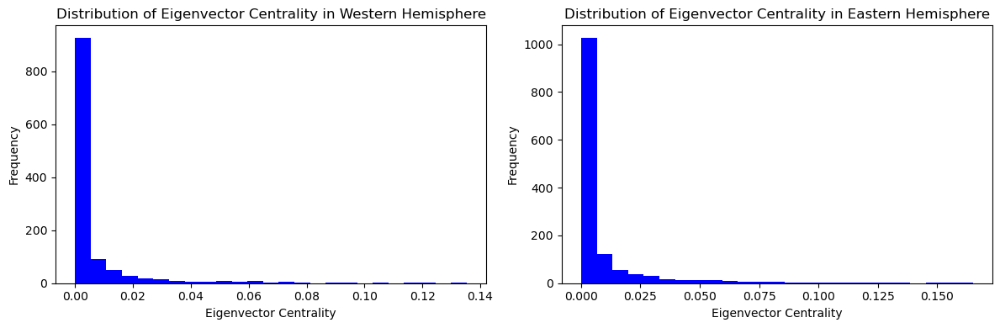

In [52]:
plt.figure(figsize=(12,4))

plt.subplot(1, 2, 1)
plt.hist(eigW['Eigenvector_Centrality'], 25, color = "blue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Western Hemisphere')

plt.subplot(1, 2, 2)
plt.hist(eigE['Eigenvector_Centrality'], 25, color = "blue")
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Eigenvector Centrality in Eastern Hemisphere')

plt.tight_layout()
plt.show()

## Putting it Altogether

In [53]:
df_merged = pd.concat([top_5_sorted_airport_conn_df, top_5_sorted_airports_dc_df,
                     top_5_sorted_airports_eig_df])

In [54]:
df_merged = mc.MoveTo3(df_merged,'Degree_Centrality')

In [55]:
df_merged = mc.MoveTo4(df_merged,'Eigenvector_Centrality')

In [56]:
df_merged = mc.MoveTo2(df_merged,'Name')

In [57]:
df_merged

,IATA,Name,Degree_Connections,Degree_Centrality,Eigenvector_Centrality,City,Country,Latitude,Longitude,Hemisphere
30,FRA,Frankfurt am Main Airport,453.0,NaN,NaN,Frankfurt,Germany,50.033333,8.570556,E
17,IST,Istanbul Airport,441.0,NaN,NaN,Istanbul,Turkey,41.275278,28.751944,E
68,AMS,Amsterdam Airport Schiphol,440.0,NaN,NaN,Amsterdam,Netherlands,52.308601,4.763890,E
71,CDG,Charles de Gaulle International Airport,440.0,NaN,NaN,Paris,France,49.012798,2.550000,E
467,ATL,Hartsfield Jackson Atlanta International Airport,417.0,NaN,NaN,Atlanta,United States,33.636700,-84.428101,W
30,FRA,Frankfurt am Main Airport,NaN,0.176402,NaN,Frankfurt,Germany,50.033333,8.570556,E
17,IST,Istanbul Airport,NaN,0.171729,NaN,Istanbul,Turkey,41.275278,28.751944,E
68,AMS,Amsterdam Airport Schiphol,NaN,0.171340,NaN,Amsterdam,Netherlands,52.308601,4.763890,E
71,CDG,Charles de Gaulle International Airport,NaN,0.171340,NaN,Paris,France,49.012798,2.550000,E
467,ATL,Hartsfield Jackson Atlanta International Airport,NaN,0.162383,NaN,Atlanta,United States,33.636700,-84.428101,W


Among the top 5 airports with the highest degree centrality in the Northern Hemisphere, the only airport that is in the Western Hemisphere was Hartsfield Jackson Atlanta International Airport, with 417 connections and a degree centrality of 0.162383. The airports that were in the top 5 in both degree and eigenvector centralities were Frankfurt am Main Airport in Frankfurt, Germany, Amsterdam Airport Schiphol in Amsterdam, Netherlands, and Charles de Gaulle International Airport in Paris, France. There high values in degree and eigenvector centralities indicate that their respective airports are integral in the global air transportation network. Surprisingly, the United States did not have any airports in the top 5 of eigenvector centrality and had only one airport that was ranked 5th among the top 5 airports in degree centrality. Additionally, heavily populated cities like New York and Los Angeles were not in the top 5, which is interesting considering the amount of people from around the world who travel to those cities.

## T-Test

We used a T-test to determine the statistical significance between airports in the Western and Eastern Hemispheres. A T-test is a statistical test that is used to compare the means of two groups. You can read more about it here: https://www.scribbr.com/statistics/t-test/. If the p-value is less than 0.05, then the mean for each centrality measure between Western and Eastern Hemispheres are statistically different. If the p-value is higher than 0.05, there is no statistical difference between the means of each hemisphere. The t-value measures how different the two groups are relative to the variability in the data. If the t-value is high, then the greater the difference between groups relative to variability. A low t-value means that the difference between groups is small compared to variability. A t-value close to zero indicates that the group means are similar. 

### Degree Centrality

In [58]:
# Perform independent t-test
dcW1 = dcW.iloc[:,[1]]
dcE1 = dcE.iloc[:,[1]]
#t_dc, p_dc = stats.ttest_ind(dcW.iloc[:,1],dcE.iloc[:,1])
t_stat, p_value = stats.ttest_ind(dcW1, dcE1)

print(f"T-Value: {t_stat}, P-Value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("The two groups are significantly different!")
else:
    print("No significant difference between groups.")

T-Value: [-3.45100925], P-Value: [0.00056752]
The two groups are significantly different!


### Eigenvector Centrality

In [59]:
# Perform independent t-test
eigW1 = eigW.iloc[:,[1]]
eigE1 = eigE.iloc[:,[1]]
#t_dc, p_dc = stats.ttest_ind(dcW.iloc[:,1],dcE.iloc[:,1])
t_stat, p_value = stats.ttest_ind(eigW1, eigE1)

print(f"T-Value: {t_stat}, P-Value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("The two groups are significantly different!")
else:
    print("No significant difference between groups.")

T-Value: [-3.92059682], P-Value: [9.06421908e-05]
The two groups are significantly different!


For each centrality measure, the means of the Western and Eastern Hemispheres, respectively, are statistically different, since each have a p-value less than 0.05. Their respective t-values are low as well, with t-value of eignevector centrality being slightly lower than that of degree centrality. The low t-value indicates that for each centrality measure, similarity exists between Western and Eastern Hemispheres. This makes sense, since air travel isn't different in either hemisphere, with the exception of time zone differences. 

## Visualizing Air Transportation Networks for Eastern and Western Hemisphere

### Degree Connections - Western Hemisphere

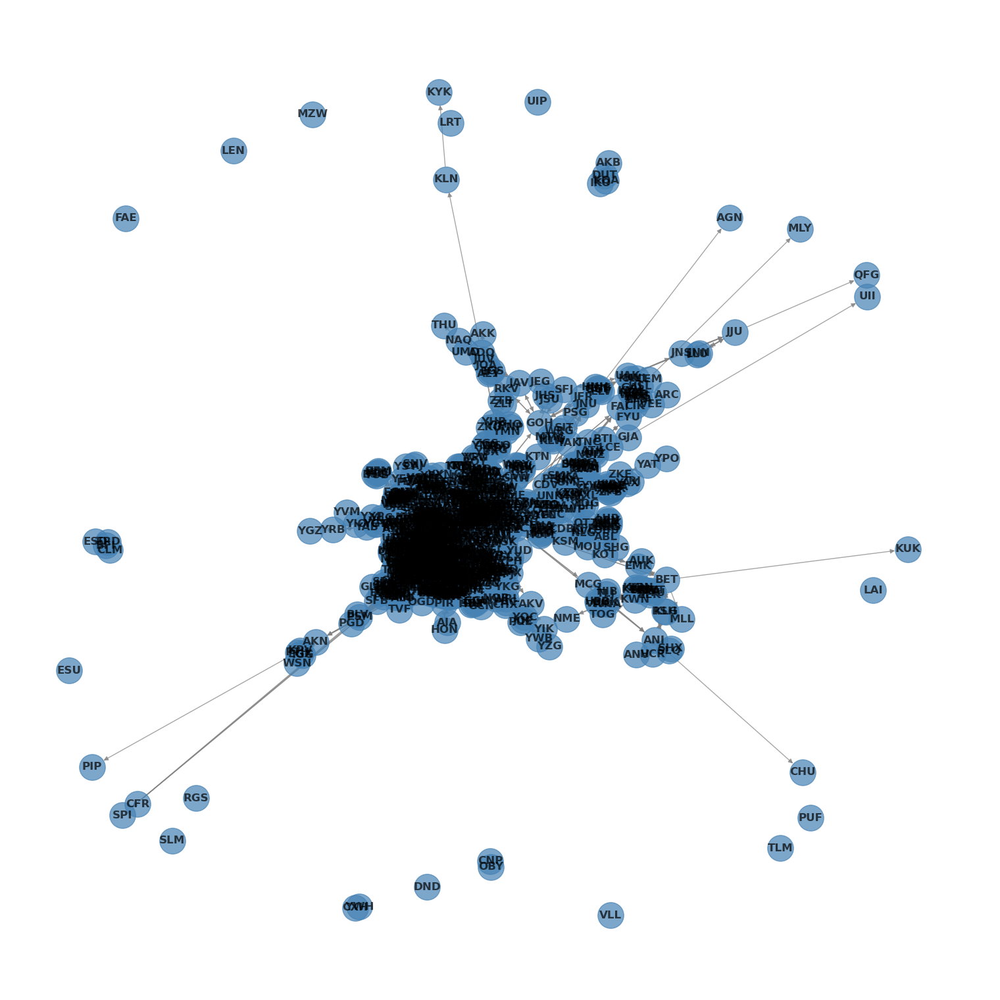

In [60]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

H = G.subgraph(list(degW['IATA']))

# Draw the Graph
nx.draw(H, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

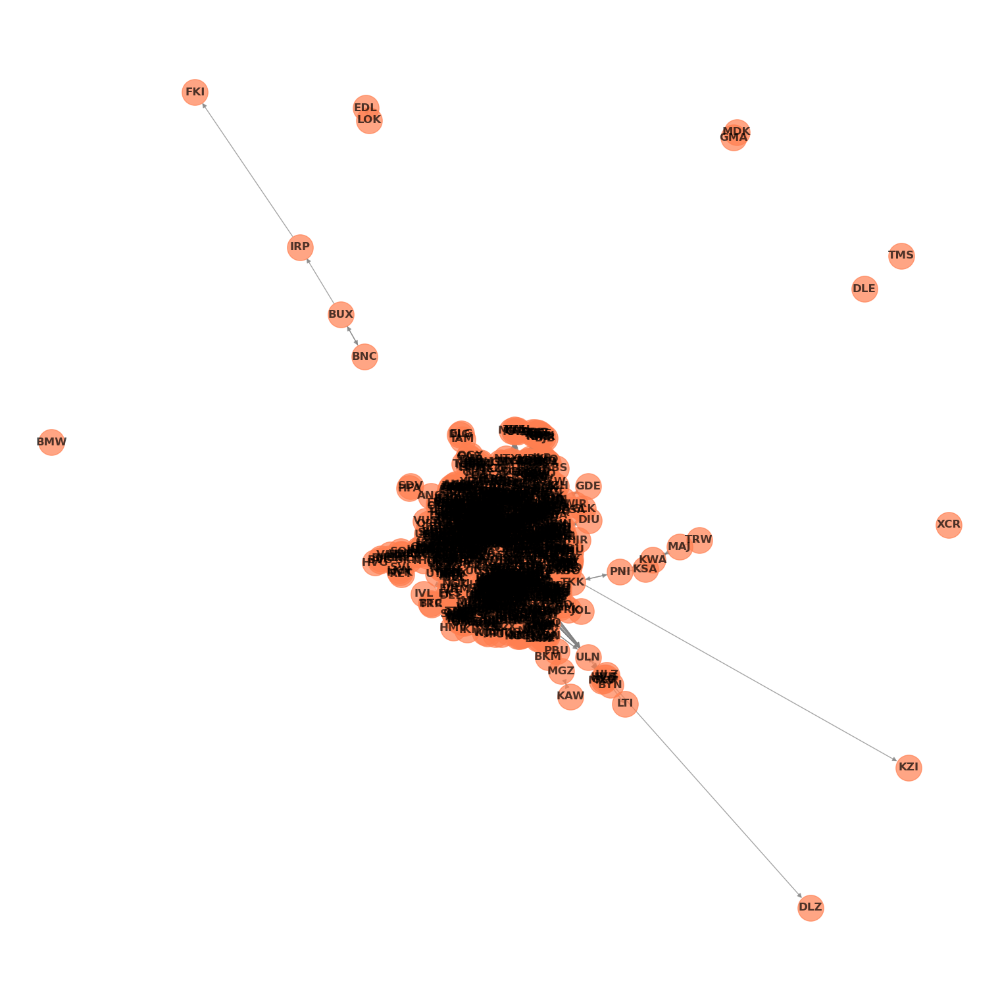

In [61]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

I = G.subgraph(list(degE['IATA']))

# Draw the Graph
nx.draw(I, with_labels=True, node_size=800, node_color='coral', font_weight='bold', 
        edge_color="grey", alpha=0.7) 

### Degree Centrality

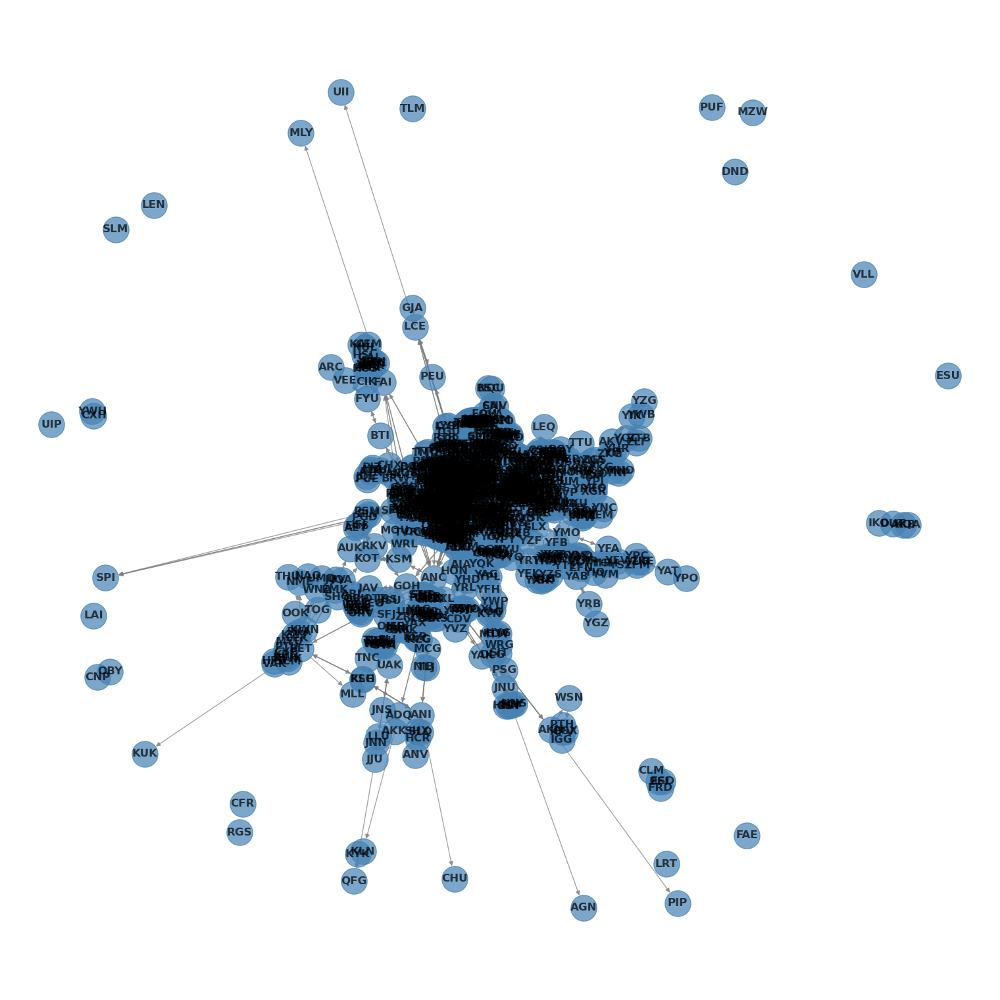

In [62]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

dcw = G.subgraph(list(dcW['IATA']))

# Draw the Graph
nx.draw(dcw, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

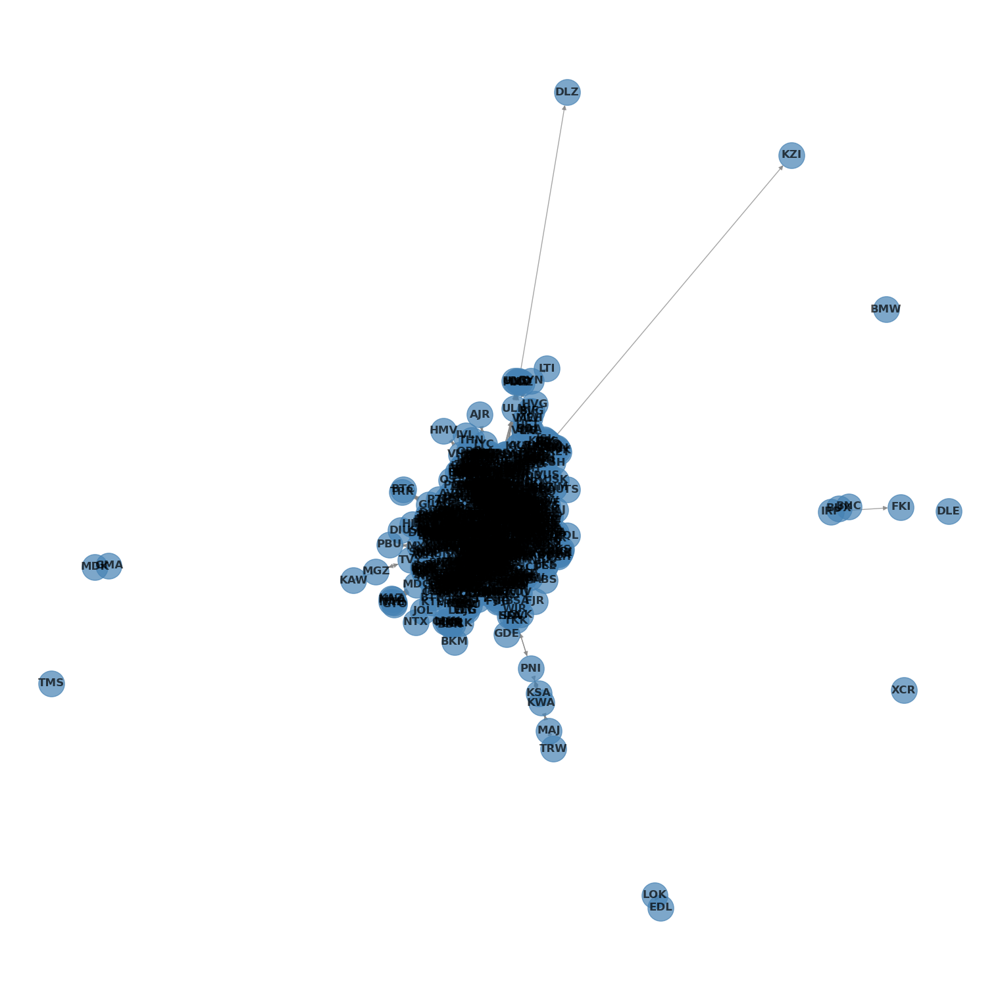

In [63]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

dce = G.subgraph(list(dcE['IATA']))

# Draw the Graph
nx.draw(dce, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

### Eigenvector Centrality

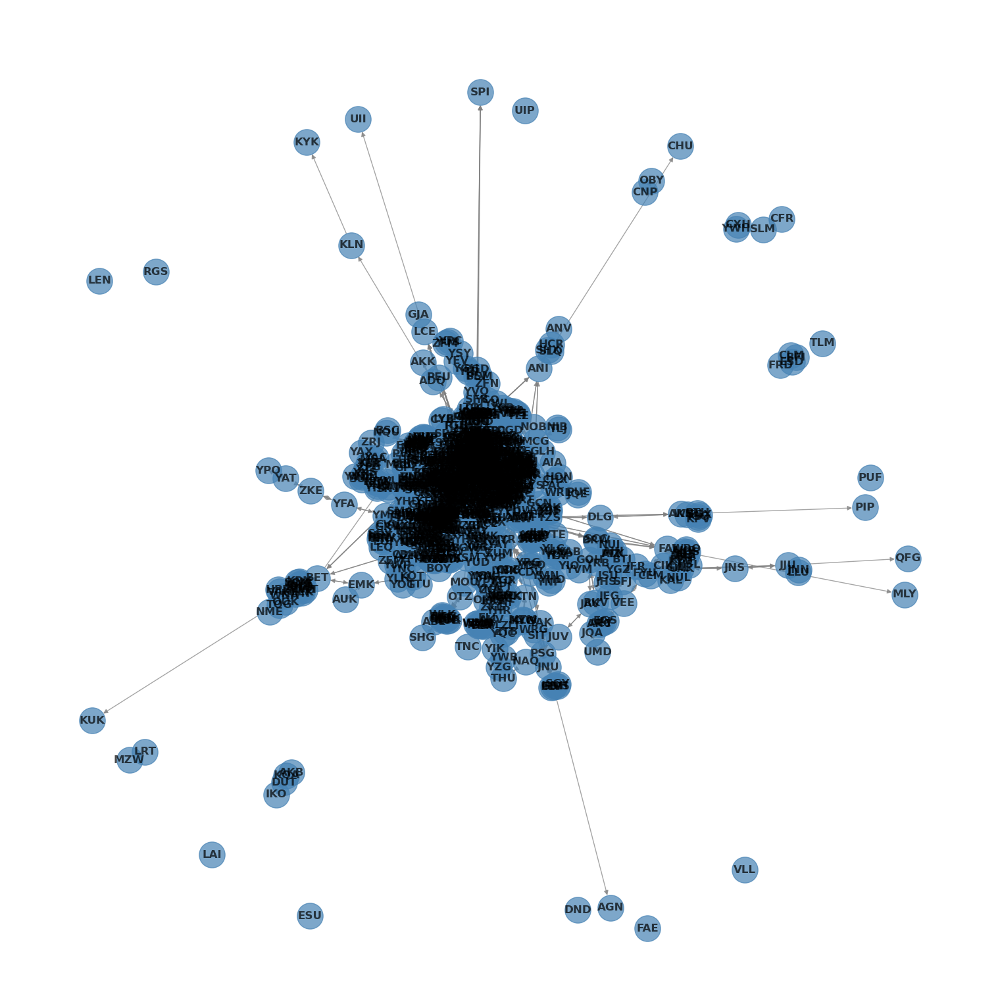

In [64]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

eigw = G.subgraph(list(eigW['IATA']))

# Draw the Graph
nx.draw(eigw, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

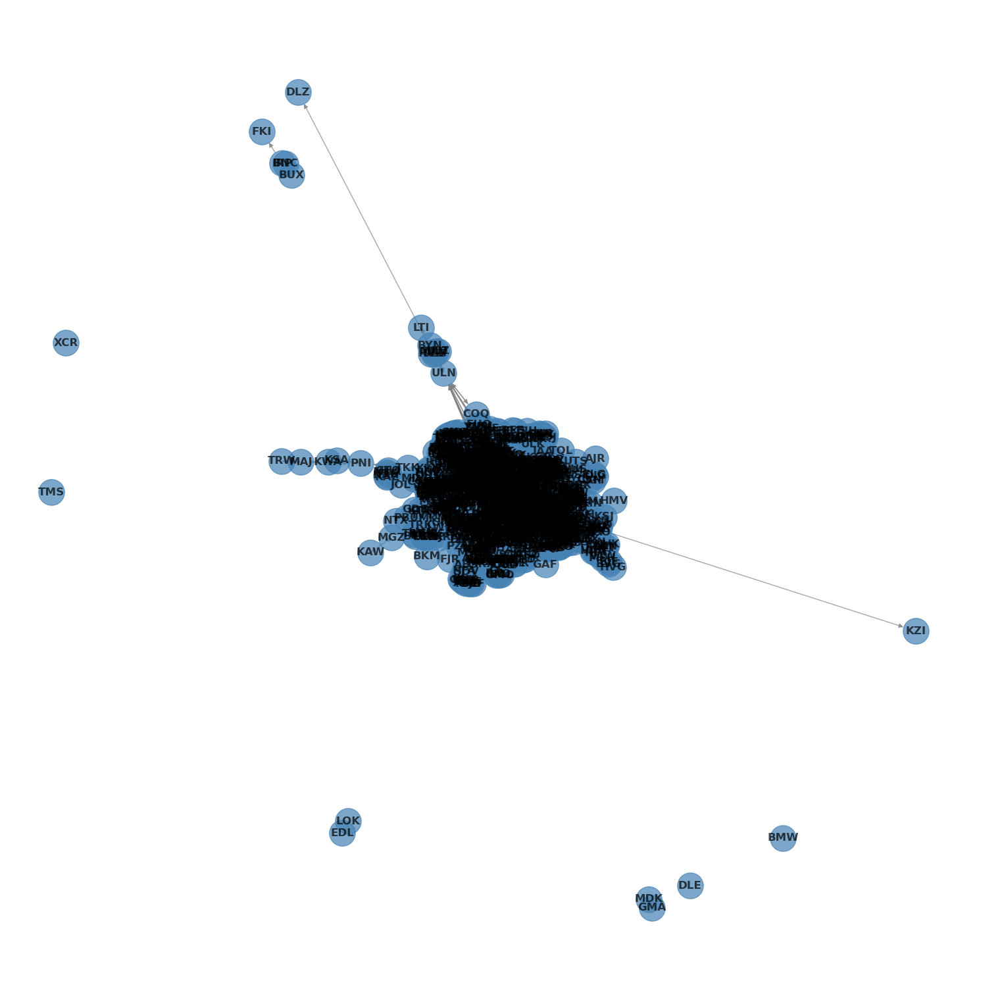

In [65]:
# set plot size
plt.rcParams["figure.figsize"] = (15,15)

eige = G.subgraph(list(eigE['IATA']))

# Draw the Graph
nx.draw(eige, with_labels=True, node_size=800, node_color='steelblue', font_weight='bold', 
        edge_color="grey", alpha=0.7)

The visualization for each centrality measure did not produce a fully connected route network, and would be an area that can be improved on in a future network analysis.